# Fundamentals of Computer Vision

This Jupyter Notebook covers **Project 3** of the course and focuses on implementing Harris Corner Detector and LoG Blob Detector to introduce fundamental concepts in image processing. Each section has questions that must be answered in a Document in PDF format.

**Important**

Both the Harris Corner Detector and LoG Blob Detector tasks (Code + Answers) must be submitted; otherwise, your work will be rejected.


## Grading Breakdown: ##
- Harris Corner Detector: 50 points (Code: 30 pts, Answers: 20 pts).
- LoG Blob Detector: 50 points (Code: 30 pts, Answers: 20 pts).

To pass Project 3, a minimum of **50 points** is required.

# **Feature Extraction**

## **Harris Corner Detector**

In this exercise, you will implement the Harris corner detection algorithm to identify corner features in images. Follow these steps to complete the implementation of the `harris_corner_detection()` function:

1. Convert to Grayscale: Convert the input image to grayscale with floating-point precision.

2. Compute Image Gradients: Compute the first derivatives $I_x$ and $I_y$ using Sobel filter, which was implemented in Project 1.

3. Compute Gradient Products: Calculate $I_x^2$, $I_y^2$ and $I_x I_y$.

4. Smooth with Gaussian: Smooth the gradient products using a Gaussian filter.

5. Construct Local Structure Matrix (M): Form the local structure matrix $M$ using the smoothed gradient products:

\begin{equation}
M = \begin{bmatrix}
I_x^2 & I_x I_y \\
I_x I_y & I_y^2
\end{bmatrix}
\end{equation}

6. Calculate Eigenvalues: Compute the eigenvalues $\lambda_1$ and $\lambda_2$ of the matrix $M$.

7. Compute Harris Response: Calculate the Harris response $R = \lambda_1 \lambda_2 - k (\lambda_1 + \lambda_2)^2$.

8. Threshold and Mark Corners: Threshold the response $R$ to detect corners and highlight them in the image.

9. Return: Return the image with corners marked in red and Harris response $R$.

In [12]:
# Project 1 Code

def flipp_kernel(kernel):
    flipped_kernel = np.zeros_like(kernel)

    for i in range(kernel.shape[0]):
        for j in range(kernel.shape[1]):
            flipped_kernel[i, j] = kernel[kernel.shape[0] - 1 - i, kernel.shape[1] - 1 - j]
            
    return flipped_kernel

def crear_stride(image, kernel, stride = 1):
    
    kernel_y = kernel.shape[0]
    kernel_x = kernel.shape[1]

    y, x = np.shape(image)
    cols = int(np.floor(((x - kernel_x) / stride) + 1))
    rows = int(np.floor(((y - kernel_y) / stride) + 1))

    subimages = np.zeros((rows, cols))
    for j in range(rows):
        j_start = j * stride
        j_end = j_start + kernel_y
        for i in range(cols):
            i_start= i * stride
            i_end = i_start + kernel_x

            subimages[j, i] = int(np.sum(kernel * image[j_start:j_end, i_start:i_end]))

    return subimages

def get_max_window(image, window_size = 3, stride = 1, padding = 1):
    img = np.pad(image, padding)
    y, x = np.shape(img)
    cols = int(np.floor(((x - window_size) / stride) + 1))
    rows = int(np.floor(((y - window_size) / stride) + 1))

    subimages = np.zeros((rows, cols))
    for j in range(rows):
        j_start = j * stride
        j_end = j_start + window_size
        for i in range(cols):
            i_start= i * stride
            i_end = i_start + window_size

            subimages[j, i] = int(np.max(img[j_start:j_end, i_start:i_end]))

    return subimages

def convolution(image, kernel, padding=0, stride=1):
    """
    Performs a convolution operation on a multi-channel image using a given kernel.

    Parameters:
      image: A 2D array representing the input image (height, width).
      kernel: A 2D array representing the convolution kernel (height, width).
      padding: An integer representing the amount of padding.
      stride: An integer representing the step size for moving the kernel.

    Returns:
      An array representing the output image after applying the convolution operation.
    """
    # Remember to flip the kernel
    # Use the np.pad() function for padding, and implement only one padding mode (e.g., constant)
    # Your code goes here!
    flipped_kernel = flipp_kernel(kernel)

    
    padded_image = np.pad(image, padding)

    imagen_filtrada = crear_stride(padded_image, flipped_kernel, stride)

    return imagen_filtrada

def sobel_filter(image, kernel_x, kernel_y, padding = 1, stride = 1):
  sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

  sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])
  gradient_x = convolution(image, kernel_x, padding, stride)
  gradient_y = convolution(image, kernel_y, padding, stride)

  gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

  return gradient_x, gradient_y, gradient_magnitude

def gaussian_kernel(kernel_size, sigma):
    """
    Creates a Gaussian kernel.

    Parameters:
        kernel_size (int): Size of the kernel (must be odd).
        sigma (float): Standard deviation for the Gaussian distribution.

    Returns:
        np.ndarray: Gaussian kernel.
    """
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd number.")

    # Create a grid of (x,y) coordinates
    ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    xx, yy = np.meshgrid(ax, ax)

    # Calculate the Gaussian function
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))

    # Normalize the kernel
    kernel /= np.sum(kernel)

    return kernel

def gaussian_filter(image, kernel_size=3, sigma=1.0, padding = 1, stride = 1):
    """
    Applies a Gaussian Filter to the given image.

    Parameters:
        image (np.ndarray): Input image (2D array for grayscale, 3D for RGB).
        kernel_size (int): Size of the Gaussian kernel (must be odd).
        sigma (float): Standard deviation for the Gaussian distribution.

    Returns:
        np.ndarray: Filtered image.
    """
    # Create the Gaussian kernel
    kernel = gaussian_kernel(kernel_size, sigma)

    # Use your convolution function
    filtered_image = convolution(image, kernel, padding, stride)

    return filtered_image

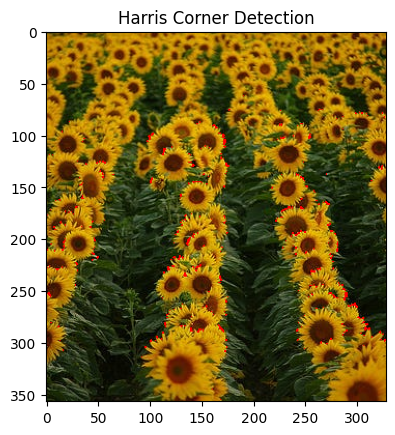

In [13]:
# Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])

def harris_corner_detector(image, k=0.04, window_size=3, threshold=2e-1):

    # Your code goes here.
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    grad_x, grad_y, _ = sobel_filter(gray_image, sobel_x, sobel_y)

    grad_x_x = gaussian_filter(grad_x * grad_x)
    grad_x_y = gaussian_filter(grad_x * grad_y)
    grad_y_y = gaussian_filter(grad_y * grad_y)

    M = np.array([
        [grad_x_x, grad_x_y],
        [grad_x_y, grad_y_y]
    ])    

    sqr = np.sqrt(grad_x_x * grad_x_x - 2 * grad_x_x * grad_y_y + grad_y_y * grad_y_y + 4 * grad_x_y * grad_x_y)
    eigen_values = (0.5 * (grad_x_x + grad_y_y + sqr), 0.5 * (grad_x_x + grad_y_y - sqr))

    R = eigen_values[0] * eigen_values[1] - k * (eigen_values[0] + eigen_values[1])**2

    corners = R > threshold * np.max(R)
    
    result = image.copy()
    result[corners] = [0, 0, 255]
    
    return result, R

# Load the image
image = cv2.imread('./images/sunflowers.jpg')

# Detect corners
harris_image, response = harris_corner_detector(image)

# Display the result
plt.imshow(cv2.cvtColor(harris_image, cv2.COLOR_BGR2RGB))
plt.title('Harris Corner Detection')
plt.show()

**Questions that must be included in your Report**.

Answer the questions briefly and directly, including the images obtained from the execution of your code to explain your conclusions. Answers must be connected to the executed code.


1. Why is Gaussian smoothing applied to the gradient products $I_x^2$, $I_y^2$ and $I_x I_y$, and what effect does it have on the results?

2. What would happen if the matrix $M$ were structured as:

\begin{equation}
M = \begin{bmatrix}
I_x^2 & 0 \\
0 & I_y^2
\end{bmatrix}
\end{equation}

3. How does the Harris response $R$ reflect the strength of a corner, and what would happen if the threshold value was set too high or too low?

4. What is the significance of the constant $k$ in the Harris response formula, and how would changing its value influence the detection of corners?

5. The Harris Corner Detector:

  A. Is it robust in detecting corners, even in the presence of noise?

  B. Is it not invariant to scale or rotation?

  C. Is it sensitive to changes in illumination?

  D. Does it fail to inherently handle affine transformations, limiting its applicability for tracking features across different perspectives?


# **LoG Blob Detector**

In this exercise, you will implement the Laplacian of Gaussian (LoG)algorithm to identify blobs in images. Follow these steps to complete the implementation of the `detect_blobs_log()` function:

1. Generate LoG Filters: Create scale-normalized Laplacian of Gaussian filters at several scales (different scales means different sigma).

2. Convolve Image: Apply the LoG filters to the image and build a scale-space representation.

3. Find Peaks: Find maxima of squared Laplacian response in scale-space and apply a threshold to filter weak responses.

4. Draw Blobs: Visualise detected blobs with circles corresponding to their scale.

In [14]:
def convolution(image, kernel, padding=0, stride=1):
    # Get dimensions
    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape
    
    # Add padding if needed
    if padding > 0:
        image_padded = np.pad(image, padding, mode='reflect')
    else:
        image_padded = image
    
    # Update dimensions after padding
    if padding > 0:
        image_h, image_w = image_padded.shape
    else:
        image_h, image_w = image.shape
        image_padded = image
    
    # Calculate output dimensions
    output_h = (image_h - kernel_h) // stride + 1
    output_w = (image_w - kernel_w) // stride + 1
    
    # Initialize output
    output = np.zeros((output_h, output_w))
    
    # Perform convolution
    for i in range(0, output_h):
        for j in range(0, output_w):
            # Calculate starting positions in padded image
            start_i = i * stride
            start_j = j * stride
            
            # Extract region from image
            region = image_padded[start_i:start_i+kernel_h, start_j:start_j+kernel_w]
            
            # Apply convolution (element-wise multiplication and sum)
            output[i, j] = np.sum(region * kernel)
    
    return output

def gaussian_kernel(kernel_size, sigma):
    
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd number.")

    # Create a grid of (x,y) coordinates
    ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    xx, yy = np.meshgrid(ax, ax)
    
    # Calculate the Gaussian function
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    
    # Normalize the kernel so it sums to 1
    kernel = kernel / np.sum(kernel)
    
    return kernel


def gaussian_filter(image, kernel_size=None, sigma=1.0):
    # Calculate kernel size if not provided
    if kernel_size is None:
        kernel_size = int(2 * np.ceil(3 * sigma) + 1)
    
    # Ensure kernel size is odd
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    # Create the Gaussian kernel
    kernel = gaussian_kernel(kernel_size, sigma)
    
    # Calculate padding needed to get output similar to input size
    # For full size output with stride=1, we need padding = (kernel_size - 1) // 2
    padding = (kernel_size - 1) // 2
    
    # Apply convolution
    filtered_image = convolution(image, kernel, padding=padding, stride=1)
    
    return filtered_image


def gaussian_laplace_manual(image, sigma):
    # Step 1: Apply Gaussian blur
    # Calculate appropriate kernel size for the given sigma
    kernel_size = int(2 * np.ceil(3 * sigma) + 1)
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    blurred = gaussian_filter(image, kernel_size=kernel_size, sigma=sigma)
    
    # Step 2: Apply Laplacian
    # Using the discrete Laplacian kernel
    laplacian_kernel = np.array([[0, 1, 0],
                                 [1, -4, 1],
                                 [0, 1, 0]])
    
    # Apply Laplacian filter with padding to maintain size
    laplacian = convolution(blurred, laplacian_kernel, padding=1, stride=1)
    
    # Step 3: Scale normalization (important for scale invariance)
    # In LoG blob detection, we multiply by sigma^2
    result = (sigma ** 2) * laplacian

    result = np.abs(result)
    
    return result

In [15]:
def find_3d_local_maxima(scale_space, scales, threshold):
    """
    Encuentra máximos locales en espacio 3D de forma optimizada
    
    Parameters:
    - scale_space: array 3D (height, width, num_scales)
    - scales: lista de valores sigma
    - threshold: umbral mínimo de respuesta
    
    Returns:
    - Lista de blobs (y, x, radius, response, scale_idx)
    """
    h, w, num_scales = scale_space.shape
    blobs = []
    
    # Pre-calcular offsets para vecindario 3D
    neighborhood_offsets = []
    for dz in [-1, 0, 1]:
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if dz == 0 and dy == 0 and dx == 0:
                    continue
                neighborhood_offsets.append((dz, dy, dx))
    
    # Padding para manejo de bordes
    padded_space = np.pad(scale_space, 
                         pad_width=((1, 1), (1, 1), (1, 1)),
                         mode='constant', 
                         constant_values=-np.inf)
    
    # Recorrer solo los puntos relevantes
    for s in range(num_scales):
        # Encontrar candidatos que superen el threshold
        candidates_mask = scale_space[:, :, s] >= threshold
        y_coords, x_coords = np.where(candidates_mask)

        #Definimos el radius para no calcularlo en cada iteracion
        radius = scales[s] * np.sqrt(2)
        
        for y, x in zip(y_coords, x_coords):
            response = scale_space[y, x, s]
            center_val = padded_space[y + 1, x + 1, s + 1]
            
            # Verificar si es máximo local
            is_maximum = True
            for dz, dy, dx in neighborhood_offsets:
                neighbor_val = padded_space[y + 1 + dy, x + 1 + dx, s + 1 + dz] # Se le suma uno dado que esta paddeado
                if center_val <= neighbor_val:
                    is_maximum = False
                    break
            
            if is_maximum:
                
                blobs.append((y, x, radius, response, s))
    
    return blobs

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 966 blobs


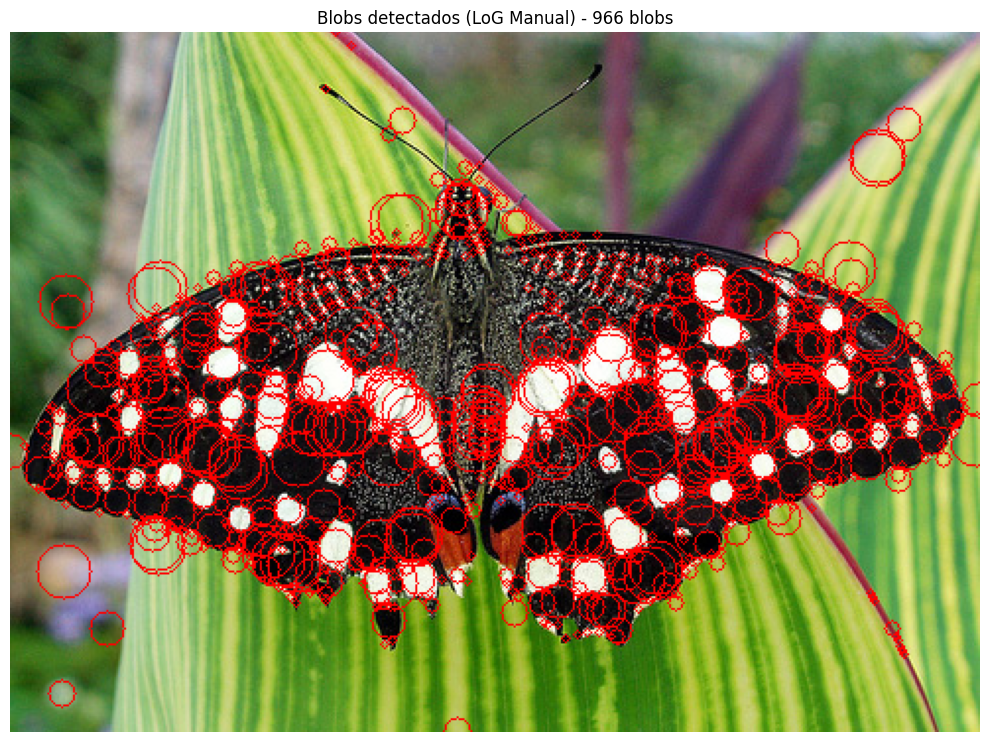

array([[[ 50,  87,  61],
        [ 53,  91,  55],
        [ 52,  88,  46],
        ...,
        [171, 162, 142],
        [163, 152, 154],
        [166, 155, 157]],

       [[ 50,  86,  56],
        [ 48,  84,  48],
        [ 50,  84,  47],
        ...,
        [174, 152, 146],
        [172, 148, 166],
        [175, 151, 169]],

       [[ 59,  96,  58],
        [ 54,  89,  55],
        [ 45,  78,  44],
        ...,
        [173, 145, 151],
        [173, 146, 172],
        [176, 149, 175]],

       ...,

       [[ 41, 125,  53],
        [ 44, 124,  55],
        [ 52, 124,  58],
        ...,
        [108, 218, 216],
        [112, 218, 201],
        [ 98, 204, 187]],

       [[ 37, 119,  60],
        [ 40, 121,  58],
        [ 48, 121,  59],
        ...,
        [ 99, 217, 218],
        [101, 219, 206],
        [ 89, 207, 194]],

       [[ 40, 128,  62],
        [ 44, 130,  58],
        [ 50, 129,  55],
        ...,
        [101, 218, 223],
        [108, 220, 212],
        [ 98, 210, 202]]

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_blobs_log(image, scales, threshold):
    # 1. Convert to grayscale and normalize
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = gray.astype(np.float32) / 255.0
    
    h, w = gray.shape
    num_scales = len(scales)
    
    print(f"Procesando {num_scales} escalas: {scales}")
    
    # 2. Generate LoG Filters and build scale-space representation
    scale_space = np.zeros((h, w, num_scales), dtype=np.float32)
    
    for i, sigma in enumerate(scales):
        # Apply LoG filter (scale-normalized)
        log_response = gaussian_laplace_manual(gray, sigma=sigma)
       
        scale_space[:, :, i] = log_response
    
    # 3. Find peaks in scale-space (3D local maxima)
    blobs = find_3d_local_maxima(scale_space, scales, threshold)
    


    print(f"Detected {len(blobs)} blobs")
    
    # Draw blobs
    output_image = draw_blobs(image, blobs)
    
    # Display result
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Blobs detectados (LoG Manual) - {len(blobs)} blobs")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return output_image

def draw_blobs(image, blobs):
    """
    Draw circles for detected blobs with different colors based on scale
    """
    output = image.copy()
    
    for (y, x, radius, response, scale_idx) in blobs:
        # Convert to integer coordinates
        center = (int(x), int(y))
        radius_int = max(2, int(radius))  # Minimum radius of 2 pixels
        
        # Draw circle
        cv2.circle(output, center, radius_int, (0, 0, 255))
    
    return output

# Load the image
image = cv2.imread('./images/butterfly.jpg')
#image = cv2.imread(path_images + 'butterfly.jpg') #, cv2.IMREAD_GRAYSCALE)


# Define the scales (sigma values)
# scales = [2, 3.5, 6, 8, 10, 15, 20]  # You can adjust these for more resolution at different scales

# threshold = 0.03


# # Para imágenes grandes/blobs grandes:
# scales = [2.0, 3.0, 4.0, 5.0, 6.0, 8.0, 10.0]
# threshold = 0.03


# Para imágenes pequeñas/detalles finos:
scales = [2.0, 3.5, 5.0, 7.0, 10.0]
threshold = 0.15

# Detect blobs using LoG
detect_blobs_log(image, scales, threshold)

In [17]:
def salt_pepper(image, salt_prob, pepper_prob):
    """
    Add salt and pepper noise to an image.

    :param image: Input image (NumPy array).
    :param salt_prob: Probability of adding salt noise (white pixels).
    :param pepper_prob: Probability of adding pepper noise (black pixels).
    :return: Noisy image with salt and pepper noise added.
    """
    noisy_image = np.copy(image)

    # Salt noise (white pixels)
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords_salt = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[tuple(coords_salt)] = 255  # For salt (white)

    # Pepper noise (black pixels)
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords_pepper = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[tuple(coords_pepper)] = 0  # For pepper (black)

    return noisy_image

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]


Detected 1054 blobs


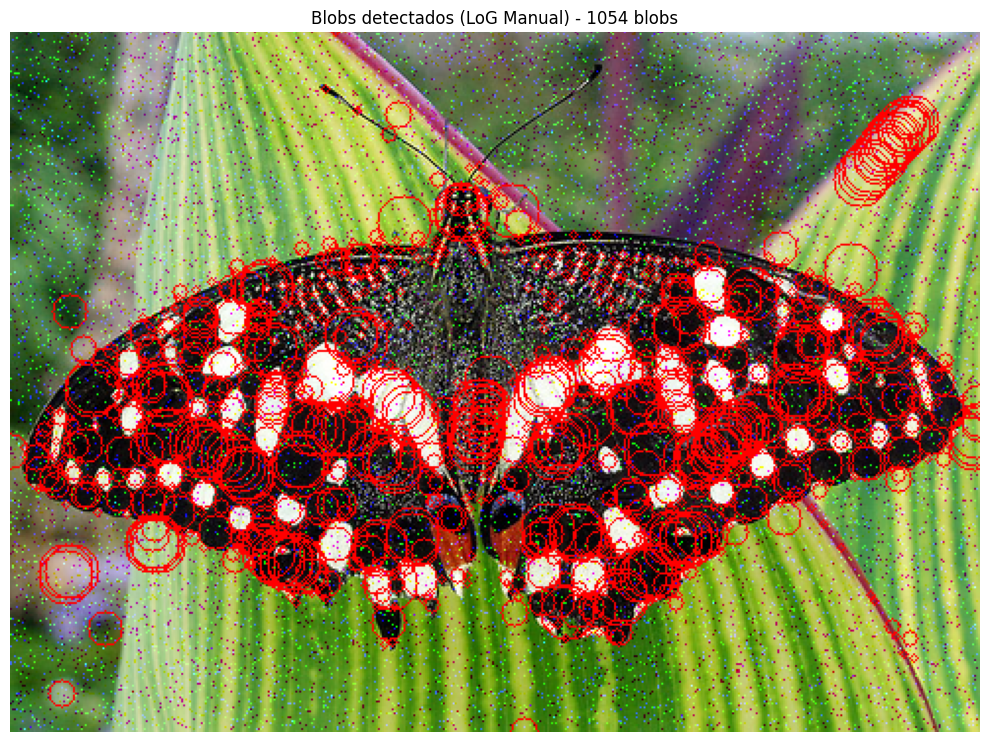

array([[[ 50,  87,  61],
        [ 53,  91,  55],
        [ 52,  88,  46],
        ...,
        [171, 162, 142],
        [163, 152, 154],
        [166, 155, 157]],

       [[ 50,  86,  56],
        [ 48,  84,  48],
        [ 50,  84,  47],
        ...,
        [174, 152, 146],
        [172, 148, 166],
        [175, 151, 169]],

       [[ 59,  96,  58],
        [ 54,  89,  55],
        [ 45,  78,  44],
        ...,
        [173, 145, 151],
        [255, 146, 172],
        [176, 149, 175]],

       ...,

       [[ 41, 125,  53],
        [ 44, 124,  55],
        [ 52, 124,  58],
        ...,
        [108, 218, 216],
        [112, 218, 201],
        [ 98, 204, 187]],

       [[ 37, 119,  60],
        [ 40, 121,  58],
        [ 48, 121,  59],
        ...,
        [ 99, 217, 218],
        [101, 219, 206],
        [ 89, 207, 194]],

       [[ 40, 128,  62],
        [ 44, 130,  58],
        [ 50, 129,  55],
        ...,
        [101, 218, 223],
        [108, 220, 212],
        [ 98, 210, 202]]

In [18]:
# Load the image
image = cv2.imread('./images/butterfly.jpg')

# Add salt-and-pepper noise
salt_prob = 0.02
pepper_prob = 0.02
noisy_image = salt_pepper(image, salt_prob, pepper_prob)

# Para imágenes pequeñas/detalles finos:
scales = [2.0, 3.5, 5.0, 7.0, 10.0]
threshold = 0.15

# Detect blobs using LoG
detect_blobs_log(noisy_image, scales, threshold)

Procesando 3 escalas: [30, 60, 120]
Detected 156 blobs


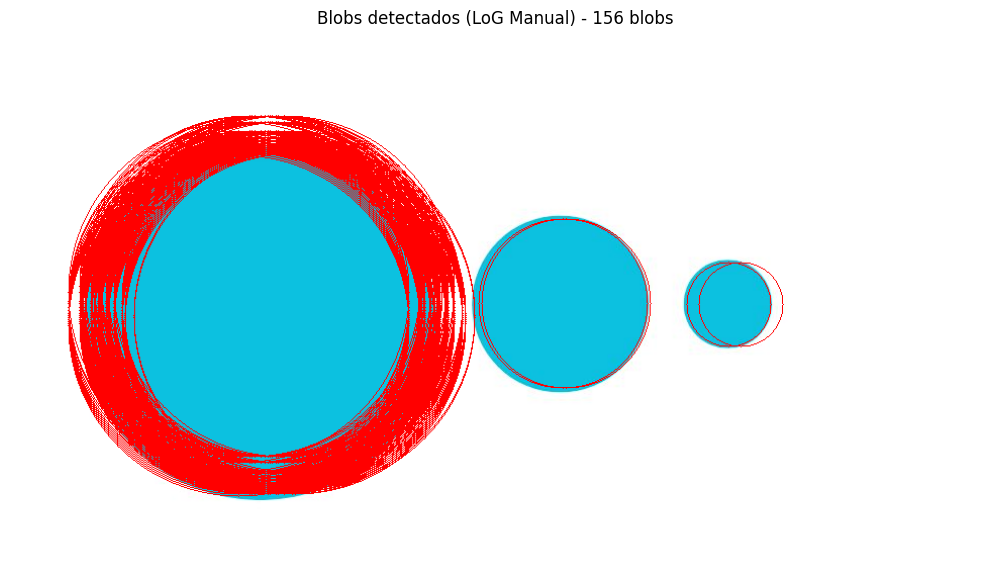

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [19]:
# Load the image
image = cv2.imread('./images/Circulos.jpg')


# Para imágenes pequeñas/detalles finos:
scales = [30, 60, 120]
threshold = 0.275

# Detect blobs using LoG
detect_blobs_log(image, scales, threshold)

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 464 blobs


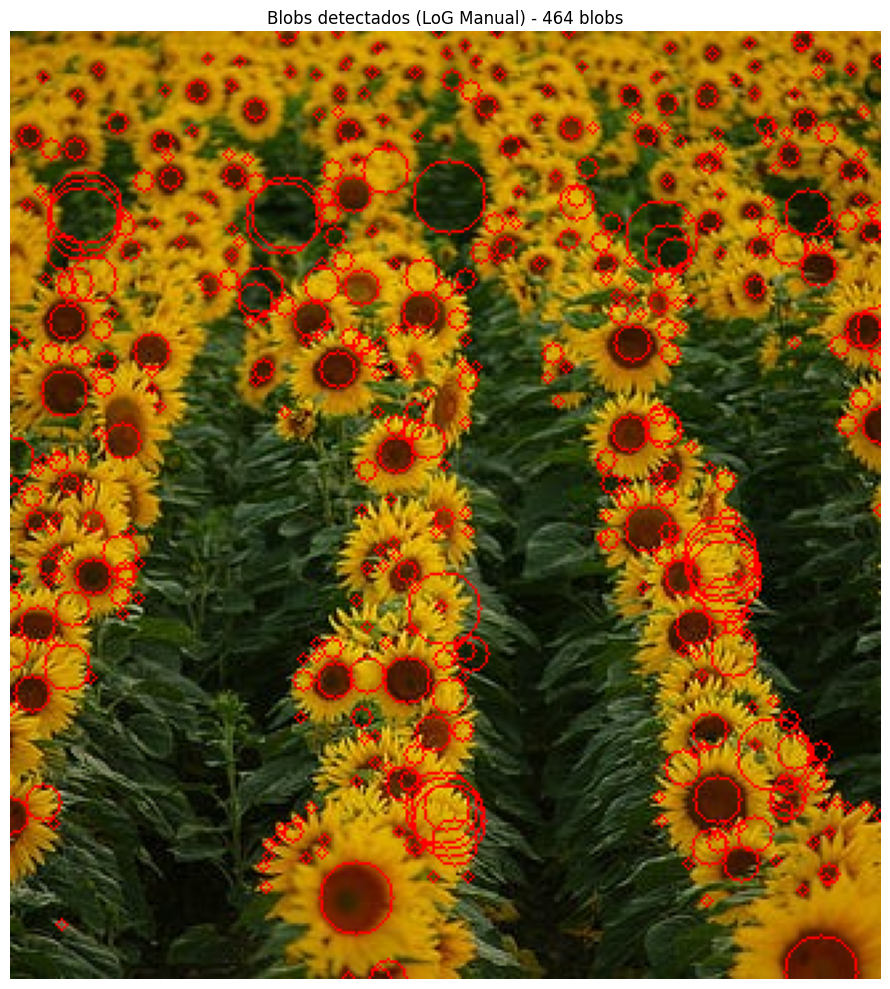

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 464 blobs


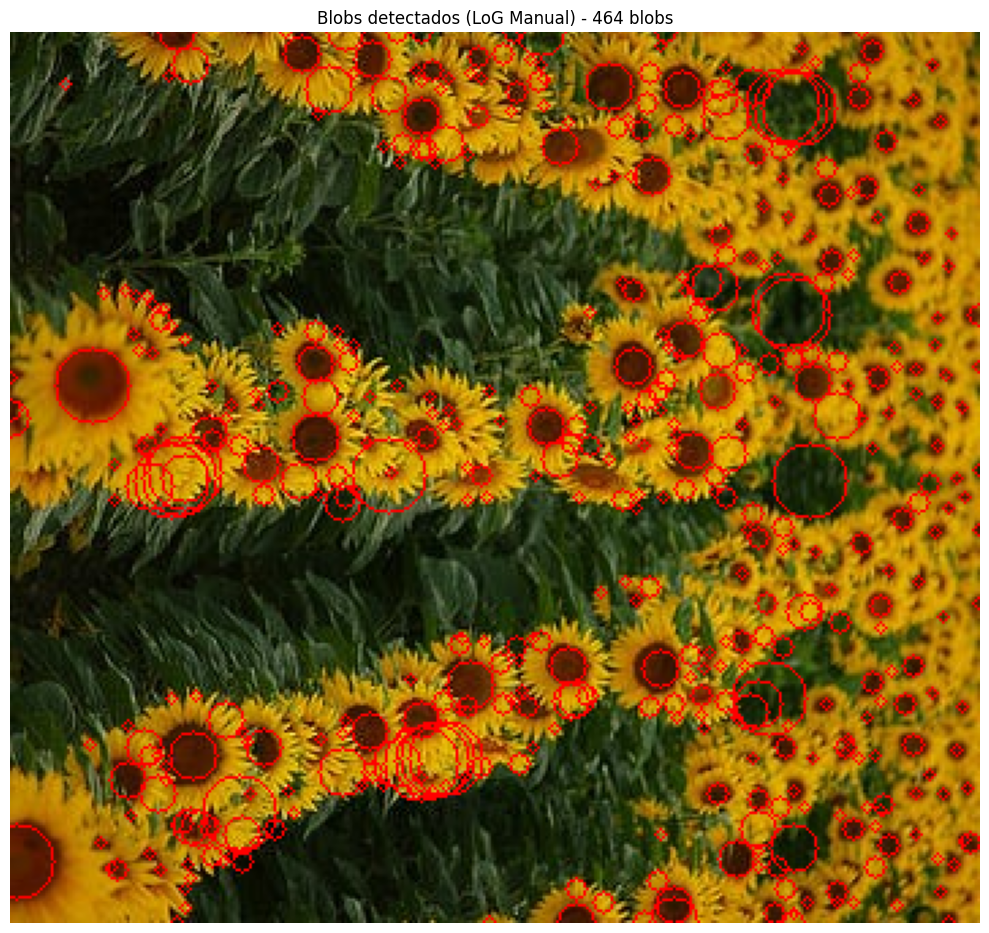

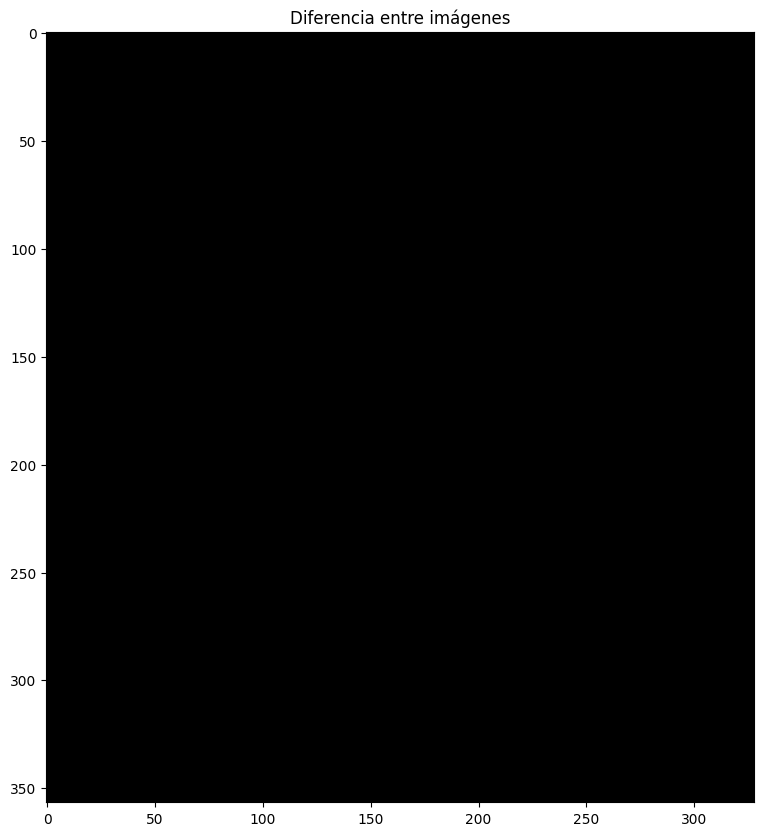

In [20]:
# Load the image
image = cv2.imread('./images/sunflowers.jpg')


# Para imágenes pequeñas/detalles finos:
scales = [2.0, 3.5, 5.0, 7.0, 10.0]
threshold = 0.15

# Detect blobs using LoG
output_image = detect_blobs_log(image, scales, threshold)

# Rotar 90 grados en sentido horario
imagen_rotada_90 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)



output_image_rotated = detect_blobs_log(imagen_rotada_90, scales, threshold)

output_image_rotated = cv2.rotate(output_image_rotated, cv2.ROTATE_90_COUNTERCLOCKWISE)

diferencia = output_image - output_image_rotated
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(diferencia, cv2.COLOR_BGR2RGB))
plt.title(f"Diferencia entre imágenes")
plt.show()






Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 464 blobs


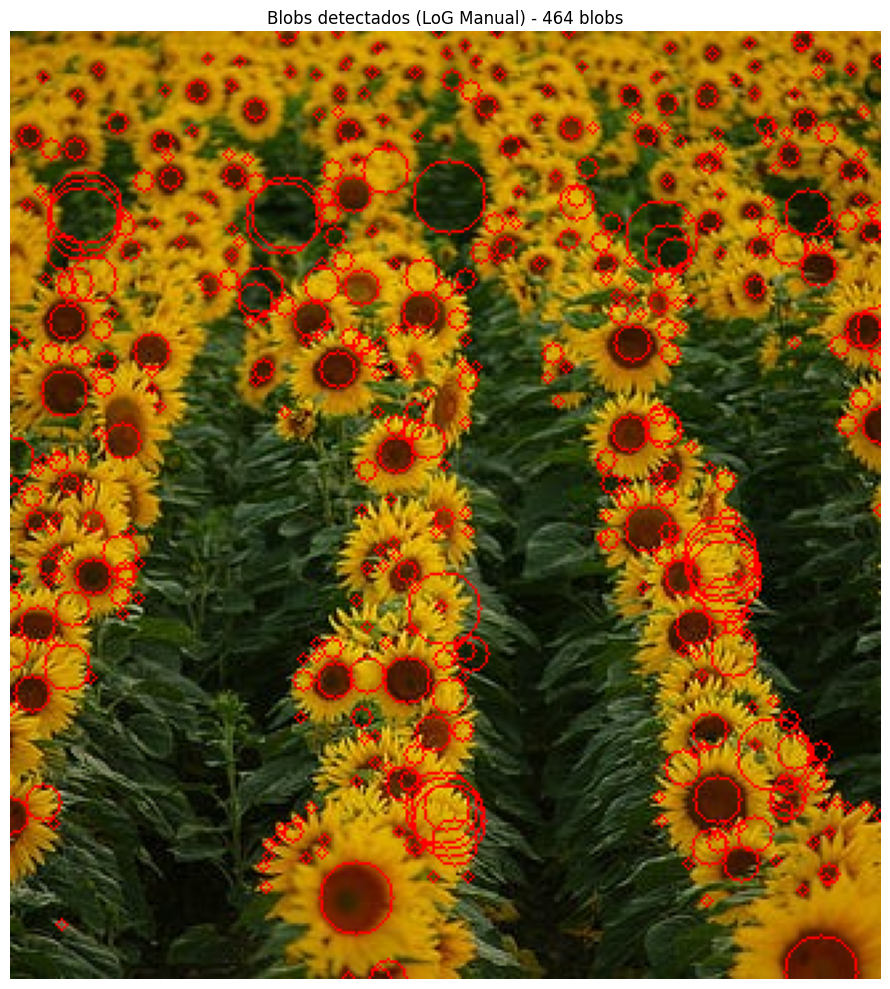

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 437 blobs


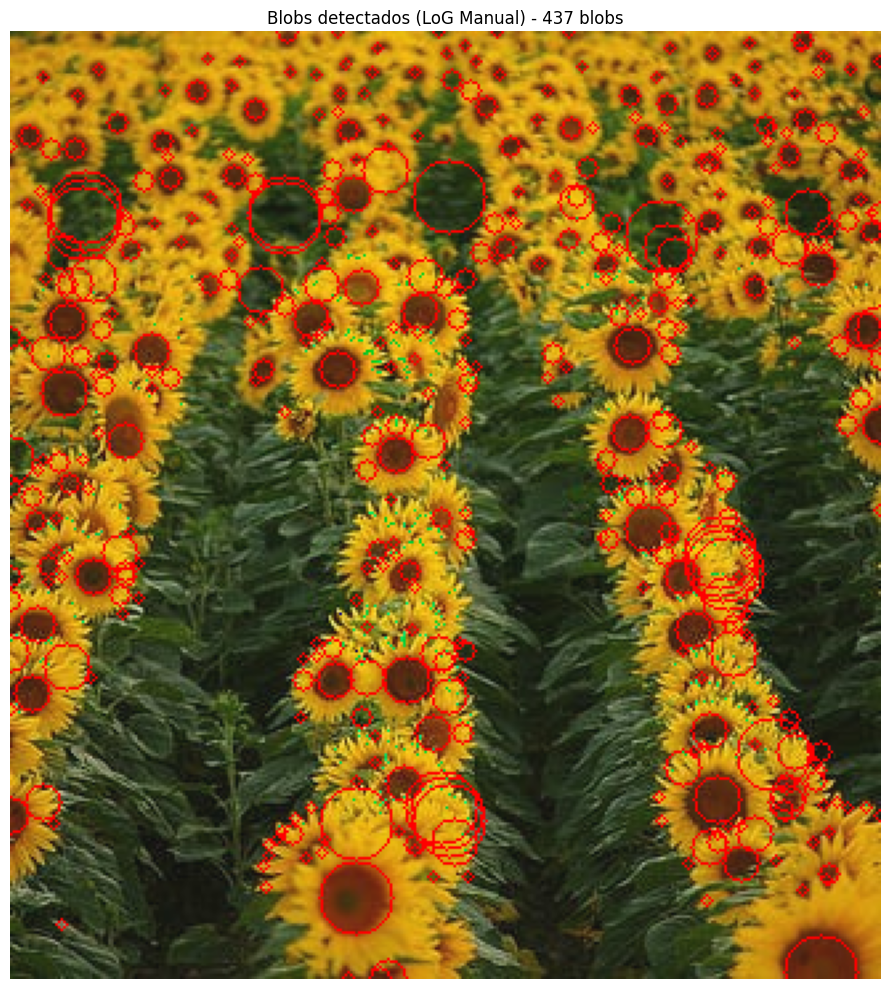

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 19 blobs


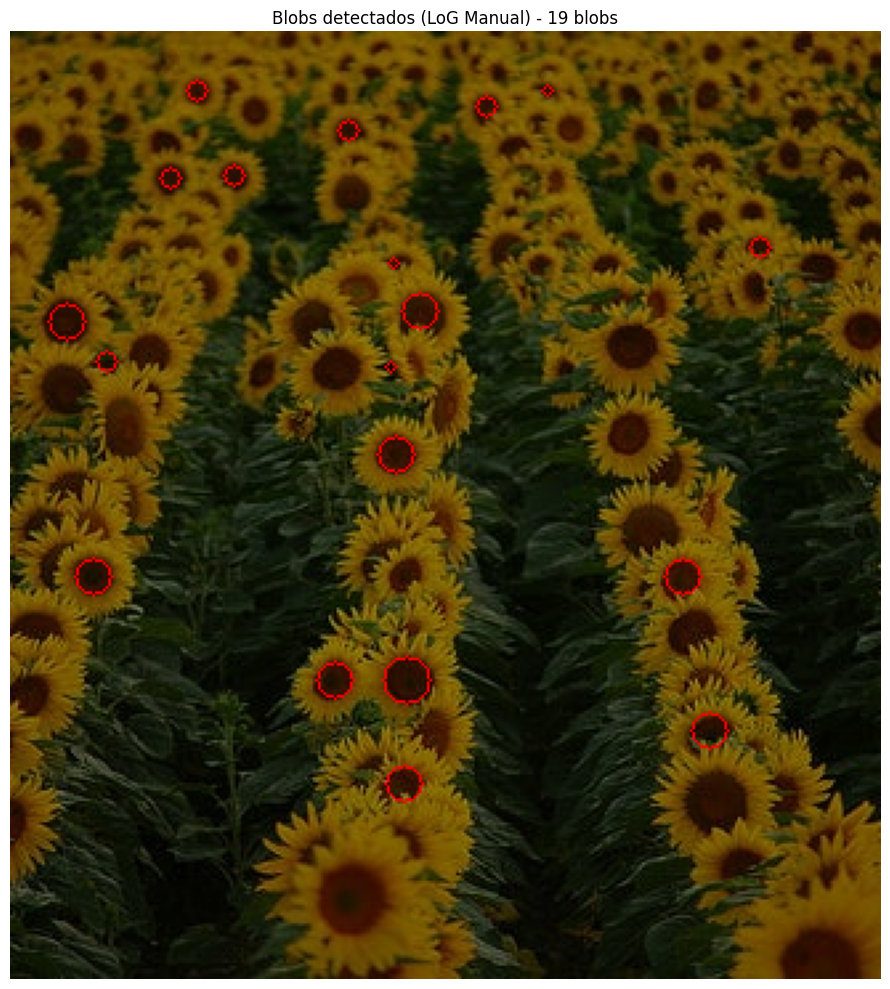

array([[[  4,  30,  22],
        [  5,  35,  28],
        [  3,  36,  33],
        ...,
        [  0,  78, 107],
        [  4,  76, 106],
        [ 12,  82, 113]],

       [[  0,  36,  36],
        [  5,  42,  43],
        [  4,  43,  46],
        ...,
        [  1,  76, 106],
        [  0,  70, 100],
        [  1,  70, 100]],

       [[  1,  56,  71],
        [  6,  60,  75],
        [  7,  59,  75],
        ...,
        [  3,  73, 104],
        [  3,  69,  99],
        [  0,  65,  94]],

       ...,

       [[  1,  18,   9],
        [  4,  22,  13],
        [  6,  21,  15],
        ...,
        [  1,  66, 102],
        [  2,  67, 105],
        [  4,  72, 108]],

       [[  8,  28,  19],
        [ 12,  30,  21],
        [ 16,  33,  27],
        ...,
        [  1,  64, 102],
        [  1,  66, 105],
        [  4,  71, 108]],

       [[  3,  25,  15],
        [  0,  19,  10],
        [  0,  16,   9],
        ...,
        [  0,  63, 102],
        [  0,  64, 104],
        [  2,  68, 106]]

In [21]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt



def harris_cv(img, k=0.04):
    result = img.copy()
    
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    
    dst = cv.cornerHarris(gray,2,3,k)
    R = dst
    result[dst>0.01*dst.max()]=[0,0,255]
    
    return result, R

filename = './images/sunflowers.jpg'
img = cv.imread(filename)

# Para imágenes pequeñas/detalles finos:
scales = [2.0, 3.5, 5.0, 7.0, 10.0]
threshold = 0.15



detect_blobs_log(img, scales, threshold)

shift = (img + 15).astype(np.uint8)
detect_blobs_log(shift, scales, threshold)

contrast = (img * 0.6).astype(np.uint8)
detect_blobs_log(contrast, scales, threshold)

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 464 blobs


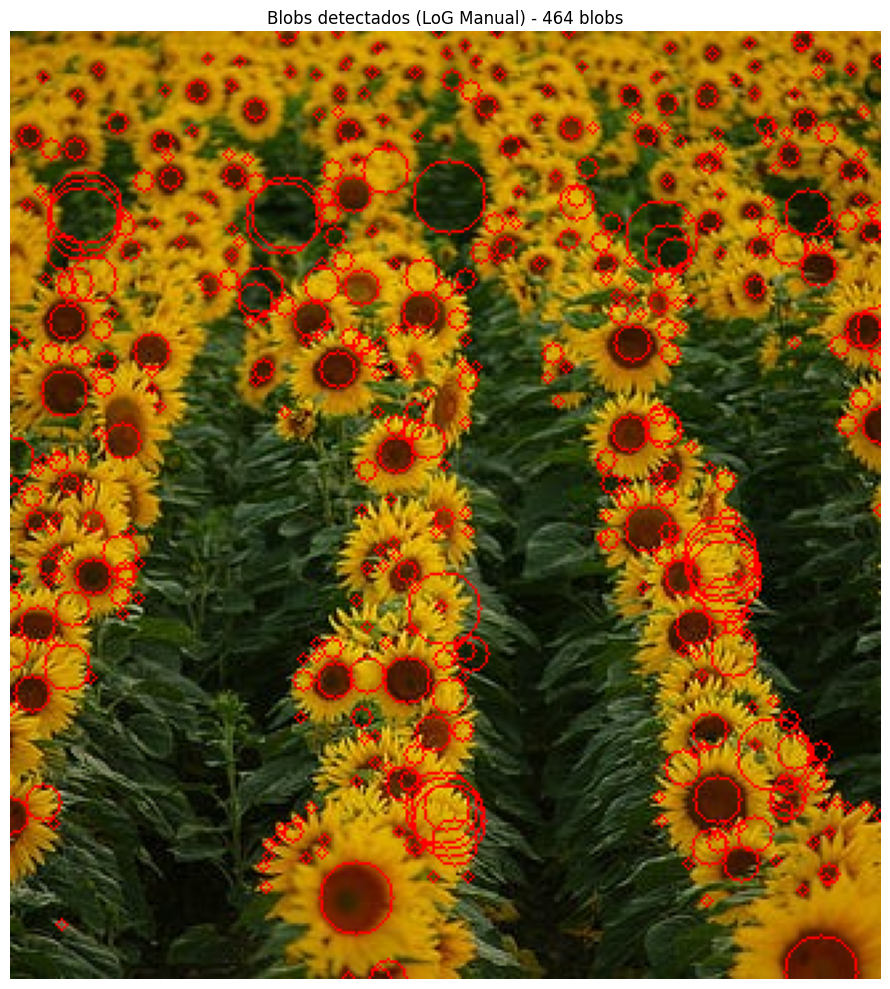

Procesando 5 escalas: [2.0, 3.5, 5.0, 7.0, 10.0]
Detected 349 blobs


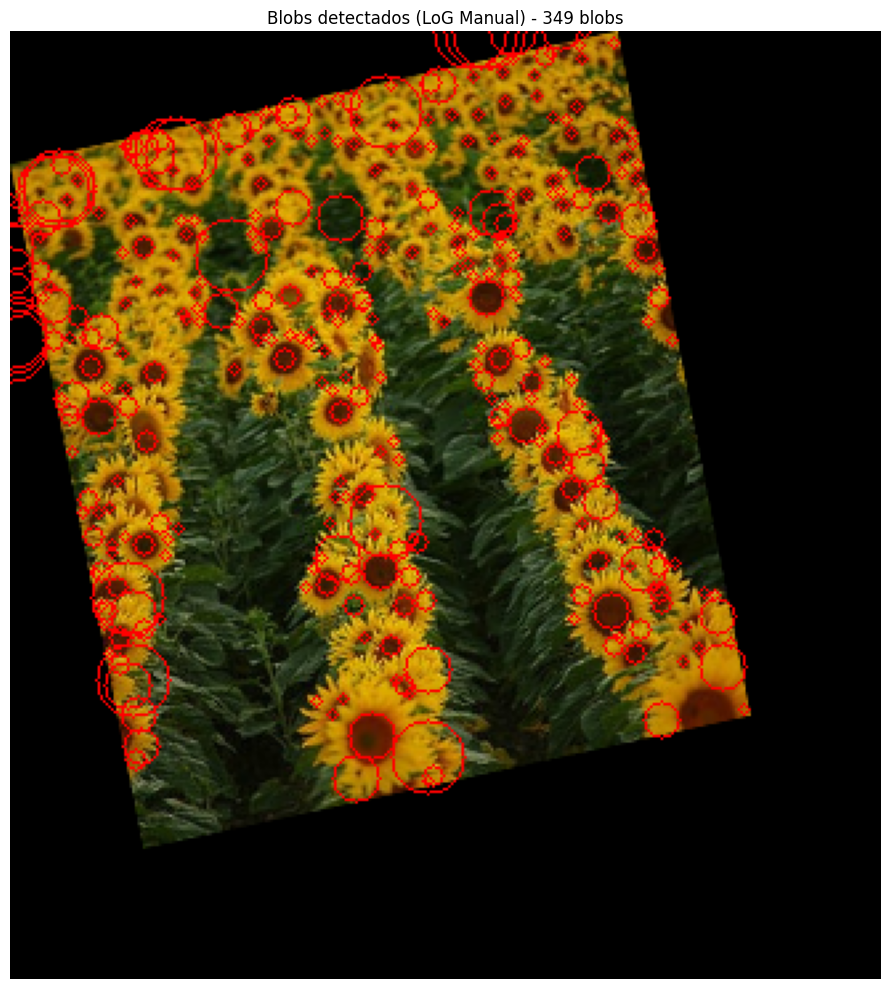

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [22]:
import cv2
import numpy as np

# Cargar la imagen
imagen = cv2.imread('images/sunflowers.jpg')
alto, ancho = imagen.shape[:2]

# Definir 3 puntos en la imagen original (float32 es necesario)
# Por ejemplo, las esquinas superior izquierda, superior derecha e inferior izquierda
puntos_origen = np.float32([
    [0, 0],          # Esquina superior izquierda
    [ancho - 1, 0],  # Esquina superior derecha
    [0, alto - 1]    # Esquina inferior izquierda
])

# Definir 3 puntos en la imagen de destino (dónde quieres que terminen)
# Vamos a inclinarla hacia la derecha (shear) y comprimirla un poco
puntos_destino = np.float32([
    [0, 50],          # Mover la esquina superior izquierda un poco hacia abajo
    [ancho - 100, 0], # Mover la esquina superior derecha 100px a la izquierda
    [50, alto - 50]   # Mover la esquina inferior izquierda 50px a la derecha y 50px hacia arriba
])

# Calcular la matriz de transformación M
matriz_afin = cv2.getAffineTransform(puntos_origen, puntos_destino)

imagen_afin = cv2.warpAffine(imagen, matriz_afin, (ancho, alto))

# Para imágenes pequeñas/detalles finos:
scales = [2.0, 3.5, 5.0, 7.0, 10.0]
threshold = 0.15

detect_blobs_log(imagen, scales, threshold)

detect_blobs_log(imagen_afin, scales, threshold)

**Questions that must be included in your Report**.

Answer the questions briefly and directly, including the images obtained from the execution of your code to explain your conclusions. Answers must be connected to the executed code.

6. What is the purpose of the Laplacian of Gaussian (LoG) filter in the context of blob detection?

7. How does the sigma value affect the LoG filter, and why is it important to use multiple scales when detecting blobs?

8. LoG Blob Detector:

  A. Is the LoG blob detector robust to noise?

  B. Is the LoG blob detector scale-invariant but not rotation-invariant?

  C. How does the LoG blob detector handle changes in illumination?

  D. Does the LoG blob detector fail to inherently handle affine transformations, limiting its applicability for tracking features across different perspectives?

